# Predictive Analysis - Parks and Arrests

#### Elise Chessman - Predictive Analysis and Parks and Arrest Data
#### Stephanie Andrade - Maps, visuals and Census Data

**Research questions:** Are drug related arrests more prevalent in and near parks? Does the race of the census tract or the location of the park influence whether there will be drug related arrests?

The aim of this predictive model will be to see if proximity to a park, the park name, and census tract race information from the American Community Survey influence the prediction of drug related arrests in New York City. We would assume that people are more likely to be criminalized for drug related arrests in non-white neighborhoods and that parks in these neighborhoods are more likely to be policed. 

After exploring the census data, park data, and NYPD arrest data, it appears as if there is not much of a relationship between parks and the type of arrests that occur. Next, we will focus on if demographic factors of the neigbhorhoods where the arrests occur that are also close to parks might influence if the model predicts arrests, specifically drug related. First I'll bring in my dataframe of arrests from the NYPD for all of 2021, with a boolean column of whether or not those arrests occurred within 100m of a park. 

**Data sources:** [NYPD 2021 Arrests](https://data.cityofnewyork.us/Public-Safety/NYPD-Arrest-Data-Year-to-Date-/uip8-fykc). [open space data](https://data.cityofnewyork.us/Recreation/Open-Space-Parks-/g84h-jbjm)  from NYC Open Data and 2020 American Community Survey [ACS](https://data.census.gov/cedsci/table?hidePreview=true&tid=ACSDT5Y2020.B03002_).

In [1]:
import pandas as pd
import geopandas as gpd
import requests
import json
import contextily as ctx
import matplotlib.pyplot as plt

This is the same arrests dataset, but with a boolean column of if the arrest occurred within 100m of a park.

In [2]:
parkarrests = pd.read_pickle('../NYCParks-SAEC/parkarrests.pandas')

parkarrests = gpd.GeoDataFrame(parkarrests, 
                        geometry = gpd.points_from_xy(
                         parkarrests.longitude, 
                         parkarrests.latitude, crs='EPSG:4326'))
pd.set_option('display.max_columns', None)

parkarrests = parkarrests.rename(columns={'index_right':'old'})
parkarrests


,arrest_key,arrest_date,pd_cd,pd_desc,ky_cd,ofns_desc,law_code,law_cat_cd,arrest_boro,arrest_precinct,jurisdiction_code,age_group,perp_sex,perp_race,x_coord_cd,y_coord_cd,latitude,longitude,geocoded_column,:@computed_region_f5dn_yrer,:@computed_region_yeji_bk3q,:@computed_region_92fq_4b7q,:@computed_region_sbqj_enih,:@computed_region_efsh_h5xi,geometry,old,propname,retireddate,zipcode,acres,location,nys_assembly,councildistrict,description,us_congress,gispropnum,retired,communityboard,department,subcategory,precinct,omppropid,sitename,nys_senate,borough,dist_to_park,hundred_m
0,238013474,2021-12-18T00:00:00.000,157,RAPE 1,104.0,RAPE,PL 1303501,F,Q,105,97,18-24,M,BLACK,1057636,203954,40.72618713000002,-73.73523390399998,"{'type': 'Point', 'coordinates': [-73.73523390...",63,3,16,63,24337,POINT (-73.73523 40.72619),771,Grand Central Parkway,None,11427,12.95352546,"North Of Grand Central Pkwy, From Bell Blvd To...",24,23,Grand Central Parkway-Potamogeton Pond,6,Q084,False,411,Q-11,Large Park Zone,112,Q084-ZN01,Potamogeton Pond,14,Q,1218.925045,False
8,233697123,2021-09-17T00:00:00.000,157,RAPE 1,104.0,RAPE,PL 1303501,F,Q,105,0,25-44,M,BLACK,1057636,203954,40.72618713000002,-73.73523390399998,"{'type': 'Point', 'coordinates': [-73.73523390...",63,3,16,63,24337,POINT (-73.73523 40.72619),771,Grand Central Parkway,None,11427,12.95352546,"North Of Grand Central Pkwy, From Bell Blvd To...",24,23,Grand Central Parkway-Potamogeton Pond,6,Q084,False,411,Q-11,Large Park Zone,112,Q084-ZN01,Potamogeton Pond,14,Q,1218.925045,False
13,230822460,2021-07-14T00:00:00.000,168,SODOMY 1,116.0,SEX CRIMES,PL 1305001,F,Q,105,0,45-64,M,BLACK,1057636,203954,40.72618713000002,-73.73523390399998,"{'type': 'Point', 'coordinates': [-73.73523390...",63,3,16,63,24337,POINT (-73.73523 40.72619),771,Grand Central Parkway,None,11427,12.95352546,"North Of Grand Central Pkwy, From Bell Blvd To...",24,23,Grand Central Parkway-Potamogeton Pond,6,Q084,False,411,Q-11,Large Park Zone,112,Q084-ZN01,Potamogeton Pond,14,Q,1218.925045,False
20,224595667,2021-02-19T00:00:00.000,153,RAPE 3,104.0,RAPE,PL 1302502,F,Q,105,0,25-44,M,BLACK,1057636,203954,40.72618713000002,-73.73523390399998,"{'type': 'Point', 'coordinates': [-73.73523390...",63,3,16,63,24337,POINT (-73.73523 40.72619),771,Grand Central Parkway,None,11427,12.95352546,"North Of Grand Central Pkwy, From Bell Blvd To...",24,23,Grand Central Parkway-Potamogeton Pond,6,Q084,False,411,Q-11,Large Park Zone,112,Q084-ZN01,Potamogeton Pond,14,Q,1218.925045,False
202,237429832,2021-12-06T00:00:00.000,205,"TRESPASS 2, CRIMINAL",352.0,CRIMINAL TRESPASS,PL 1401501,M,Q,105,0,25-44,M,BLACK,1055501,197102,40.707397564000075,-73.74300919899997,"{'type': 'Point', 'coordinates': [-73.74300919...",63,3,6,63,24338,POINT (-73.74301 40.70740),771,Grand Central Parkway,None,11427,12.95352546,"North Of Grand Central Pkwy, From Bell Blvd To...",24,23,Grand Central Parkway-Potamogeton Pond,6,Q084,False,411,Q-11,Large Park Zone,112,Q084-ZN01,Potamogeton Pond,14,Q,2472.564394,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135134,222855064,2021-01-09T00:00:00.000,29,NYS PAROLE VIOLATION,995.0,FOR OTHER AUTHORITIES,FOA9000029,NaN,K,76,0,25-44,M,BLACK,981936,184577,40.67330588400005,-74.00834343599996,"{'type': 'Point', 'coordinates': [-74.00834343...",14,2,7,48,13514,POINT (-74.00834 40.67331),696,Red Hook Recreation Area,None,11231,9.13591035,"Columbia And Bay Streets, SE Of ""Halleck St"" S...",51,38,Red Hook Recreation Area-Red Hook Park Zone 3,10,B126,False,306,B-06,Large Park Zone,3,B126-ZN03,Red Hook Park Zone 3,25,B,15.355165,True
138006,223833241,2021-02-02T00:00:00.000,339,"LARCENY,PETIT FROM OPEN AREAS,",341.0,PETIT LARCENY,PL 1552500,M,Q,100,0,18-24,M,WHITE,1031835,151473,40.58231495500007,-73.82869068099996,"{'type': 'Point', 'coordinates': [-73.82869068...",51,3,41,58,20532,POINT (-73

In [3]:
requestString = 'https://data.cityofnewyork.us/resource/4j29-i5ry.geojson'
parkgdf = gpd.read_file(requestString)


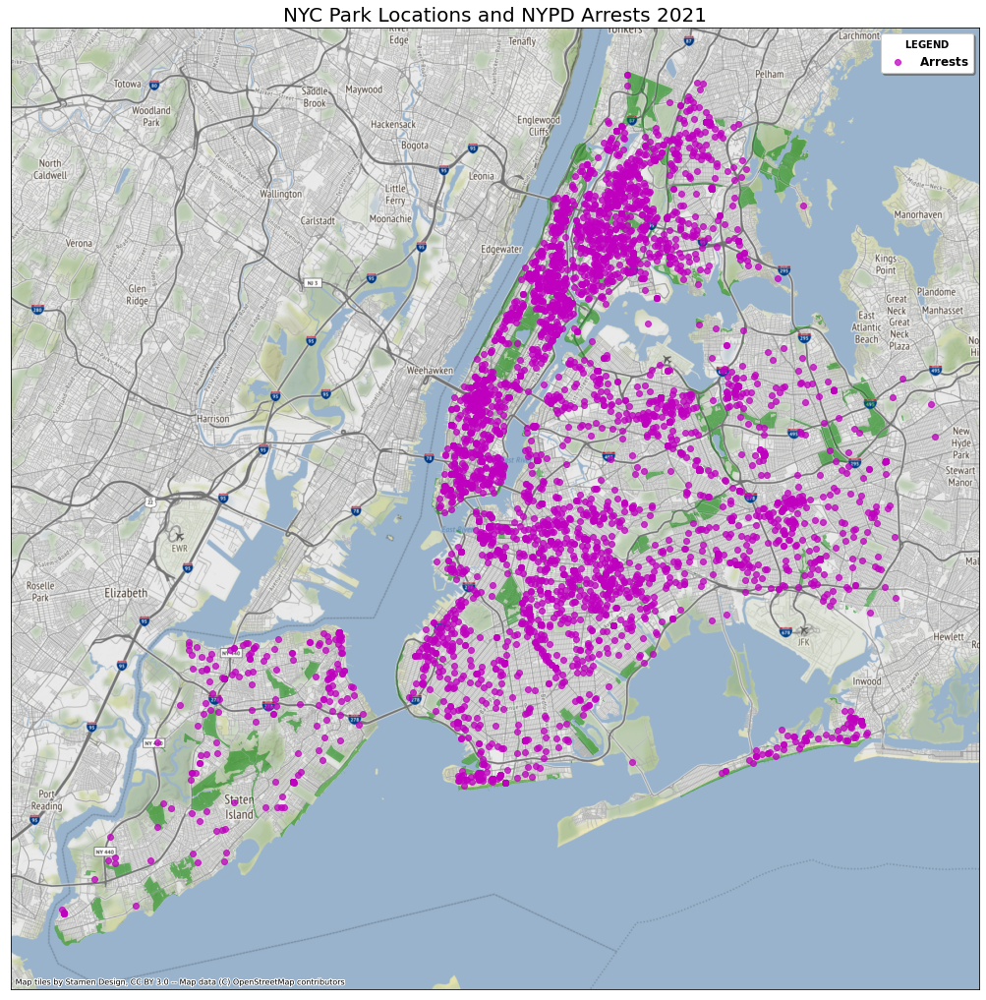

In [4]:
fig, ax = plt.subplots(figsize=(18,18))
parkgdf.to_crs('EPSG:3857').plot(color='g', alpha=0.5, ax=ax, label = 'Parks')
parkarrests.sample(5000).to_crs('EPSG:3857').plot(color='m', alpha=0.75, ax=ax, label=r'$\bf{Arrests}$') 

ctx.add_basemap(ax, zoom=12)

ax.set_xticks([])
ax.set_yticks([])
plt.title('NYC Park Locations and NYPD Arrests 2021',fontdict={'fontsize': 20})
ax.legend(fontsize=12,loc='upper right', fancybox = True,shadow=True, title = r'$\bf{LEGEND}$')

## Bringing in the Census Data

Steph nicely cleaned the census data and created race percentage columns by census tract level using ACS data for New York City, so we'll bring that in as a Geopackage. 

In [5]:
race_Df = gpd.read_file('../NYCParks-SAEC/race_Df_clean.gpkg')

## Spatial Joining Census and Arrest Data

Next, I'll join the parks and the census data to look at how race at the census tract level influences the predicted park arrests.

In [6]:
parkarrests.to_crs('EPSG:4326', inplace=True)
race_Df.to_crs('EPSG:4326', inplace=True)

In [7]:
allgdf = gpd.sjoin(race_Df, parkarrests, how='left', predicate='intersects')

In [8]:
allgdf = allgdf.reset_index(drop=True)

From my previous data exploration looking at the type of arrests that happen near parks vs. the arrest dataset broadly, I found that there was generally very little difference between the arrests close to parks and the entire arrest dataset when it comes to the type of arrests that happen. One that did increase was the percentage of dangerous drug arrests (7.6% of  arrests near parks in 2021 as opposed to 6.7% for the arrests overall). So next I'll use arrests near parks as my total dataset to try to predict drug related arrests near parks and to see if those arrests are influenced by the race of the census tract.

In [9]:
allgdf['drug_offense']=allgdf.ofns_desc=='DANGEROUS DRUGS'
allgdf

,geoid,name,Total,White,Black,American Indian and Alaska Native,Asian,Pacific Islander,Other Race,Two or more races,Hispanic,Percent_White,Percent_Black,Percent_American_Indian_and_Alaska Native,Percent_Asian,Percent_Pacific_Islander,Percent_Other_Race,Percent_Two_or_more_races,Percent_Hispanic,geometry,index_right,arrest_key,arrest_date,pd_cd,pd_desc,ky_cd,ofns_desc,law_code,law_cat_cd,arrest_boro,arrest_precinct,jurisdiction_code,age_group,perp_sex,perp_race,x_coord_cd,y_coord_cd,latitude,longitude,geocoded_column,:@computed_region_f5dn_yrer,:@computed_region_yeji_bk3q,:@computed_region_92fq_4b7q,:@computed_region_sbqj_enih,:@computed_region_efsh_h5xi,old,propname,retireddate,zipcode,acres,location,nys_assembly,councildistrict,description,us_congress,gispropnum,retired,communityboard,department,subcategory,precinct,omppropid,sitename,nys_senate,borough,dist_to_park,hundred_m,drug_offense
0,14000US36005000100,"Census Tract 1, Bronx, NY",6600.0,817.0,3234.0,27.0,171.0,0.0,0.0,36.0,2315.0,12.378788,49.00,0.409091,2.590909,0.0,0.000000,0.545455,35.075758,"MULTIPOLYGON (((-73.89772 40.79514, -73.89611 ...",150976.0,224175403,2021-02-10T00:00:00.000,779,"PUBLIC ADMINISTRATION,UNCLASSI",126.0,MISCELLANEOUS PENAL LAW,PL 215510B,F,Q,114,0,25-44,M,BLACK,1016252,226442,40.78815742500007,-73.88443489899998,"{'type': 'Point', 'coordinates': [-73.88443489...",39,5,4,72,14781,798.0,Randall's Island Park,None,10035,66.44805203999999,"N Of FDNY Academy, E Of Central Pking Lots; In...",68,8,Randalls Island-Sunken Meadow,12,M104,False,111,M-11R,Flagship Park Zone,25,M104-ZN02,Sunken Meadow,29,M,2576.874201,False,False
1,14000US36005000100,"Census Tract 1, Bronx, NY",6600.0,817.0,3234.0,27.0,171.0,0.0,0.0,36.0,2315.0,12.378788,49.00,0.409091,2.590909,0.0,0.000000,0.545455,35.075758,"MULTIPOLYGON (((-73.89772 40.79514, -73.89611 ...",130404.0,226619645,2021-04-07T00:00:00.000,49,U.S. CODE UNCLASSIFIED,995.0,FOR OTHER AUTHORITIES,FOA9000049,NaN,Q,114,0,18-24,M,WHITE HISPANIC,1016513,227787,40.791848137000045,-73.88348590799995,"{'type': 'Point', 'coordinates': [-73.88348590...",39,5,4,72,14781,767.0,Soundview Park,None,10473,23.31397816,East Half Of Waterfront From Rosedale Ave To L...,85,18,Soundview Park Zone 6,15,X118,False,209,X-09,Large Park Zone,43,X118-ZN06,Soundview Park Zone 6,"32, 34",X,2491.364333,False,False
2,14000US36005000100,"Census Tract 1, Bronx, NY",6600.0,817.0,3234.0,27.0,171.0,0.0,0.0,36.0,2315.0,12.378788,49.00,0.409091,2.590909,0.0,0.000000,0.545455,35.075758,"MULTIPOLYGON (((-73.89772 40.79514, -73.89611 ...",111145.0,228382121,2021-05-19T00:00:00.000,49,U.S. CODE UNCLASSIFIED,995.0,FOR OTHER AUTHORITIES,FOA9000049,NaN,Q,114,0,18-24,M,BLACK,1016513,227787,40.791848137000045,-73.88348590799995,"{'type': 'Point', 'coordinates': [-73.88348590...",39,5,4,72,14781,767.0,Soundview Park,None,10473,23.31397816,East Half Of Waterfront From Rosedale Ave To L...,85,18,Soundview Park Zone 6,15,X118,False,209,X-09,Large Park Zone,43,X118-ZN06,Soundview Park Zone 6,"32, 34",X,2491.364333,False,False
3,14000US36005000100,"Census Tract 1, Bronx, NY",6600.0,817.0,3234.0,27.0,171.0,0.0,0.0,36.0,2315.0,12.378788,49.00,0.409091,2.590909,0.0,0.000000,0.545455,35.075758,"MULTIPOLYGON (((-73.89772 40.79514, -73.89611 ...",71521.0,230246752,2021-06-30T00:00:00.000,792,WEAPONS POSSESSION 1 & 2,118.0,DANGEROUS WEAPONS,PL 265031B,F,Q,114,0,18-24,M,BLACK,1016513,227787,40.791848137000045,-73.88348590799995,"{'type': 'Point', 'coordinates': [-73.88348590...",39,5,4,72,14781,767.0,Soundview Park,None,10473,23.31397816,East Half Of Waterfront From Rosedale Ave To L...,85,18,Soundview Park Zone 6,15,X118,False,209,X-09,Large Park Zone,43,X118-ZN06,Soundview Park Zone 6,"32, 34",X,2491.364333,False,False
4,14000US36005000100,"Census Tract 1, Bronx, NY",6600.0,817.0,3234.0,27.0,171.0,0.0,0.0,36.0,2315.0,12.378788,49.00,0.409091,2.590909,0.0,0.000000,0.545455,35.075758,"MULTIPOLYGON (((-73.89772 40.79514, -73.89611 ...",139979.0,224568514,2021-02-19T00:00:

Next I created a column that combines the drug offense and distance to park boolean columns. Used & to combine the boolean columns (more about that here: https://stackoverflow.com/questions/21415661/logical-operators-for-boolean-indexing-in-pandas)
    

In [10]:
allgdf['park_drug'] =  (allgdf.hundred_m) & (allgdf.drug_offense)
allgdf.sample(20)
allgdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 155520 entries, 0 to 155519
Data columns (total 69 columns):
 #   Column                                     Non-Null Count   Dtype   
---  ------                                     --------------   -----   
 0   geoid                                      155520 non-null  object  
 1   name                                       155520 non-null  object  
 2   Total                                      155520 non-null  float64 
 3   White                                      155520 non-null  float64 
 4   Black                                      155520 non-null  float64 
 5   American Indian and Alaska Native          155520 non-null  float64 
 6   Asian                                      155520 non-null  float64 
 7   Pacific Islander                           155520 non-null  float64 
 8   Other Race                                 155520 non-null  float64 
 9   Two or more races                          155520 non-null  fl

## Predicting Drug Related Arrests Around Parks

Here we'll start to analyze whether we can use machine learning to predict drug related offenses that happen near parks.

In [11]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

xvars = ['Percent_Black','Percent_Hispanic','Percent_White',]
yvar = 'park_drug'

df_to_fit = allgdf[xvars+[yvar]].dropna()

X_train, X_test, y_train, y_test = train_test_split(
    df_to_fit[xvars], df_to_fit[yvar], test_size = 0.25, random_state = 1)

print(len(X_train), len(y_train) )
print(len(X_test), len(y_test) )

115519 115519
38507 38507


I'll start by estimating a random forests model, and assigning the predicted y values from the test sample to y_pred.

In [12]:
from sklearn.ensemble import RandomForestClassifier 

rf = RandomForestClassifier(n_estimators = 50, random_state = 1)

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
y_pred

print(len(X_test), len(y_pred))



38507 38507


### Plotting the Confusion Matrix

[[38291     0]
 [  216     0]]
Accuracy score: 0.9944
              precision    recall  f1-score   support

       False       0.99      1.00      1.00     38291
        True       0.00      0.00      0.00       216

    accuracy                           0.99     38507
   macro avg       0.50      0.50      0.50     38507
weighted avg       0.99      0.99      0.99     38507



/Users/stephanieandrade/opt/anaconda3/envs/uds/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/stephanieandrade/opt/anaconda3/envs/uds/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/stephanieandrade/opt/anaconda3/envs/uds/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(av

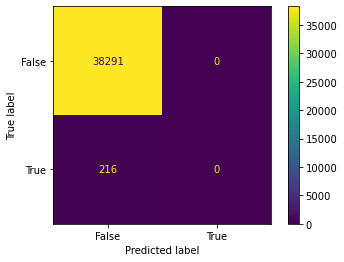

In [13]:

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, ConfusionMatrixDisplay

print(confusion_matrix(y_test, y_pred))
confusion_matrix

print('Accuracy score: {:.4f}'.format(accuracy_score(y_test, y_pred)))

print(classification_report(y_test, y_pred))

ConfusionMatrixDisplay.from_predictions(y_test, y_pred)

Ok... clearly I have more work to do on this matrix since the confusion matrix has a whopping 0 in the "True and True" box. Apparently the model is not very helpful in predicting drug related arrests near parks. I'll plot the variables of importance as well here just to start getting an idea of where to go next.

Text(0, 0.5, 'Mean decrease in impurity')

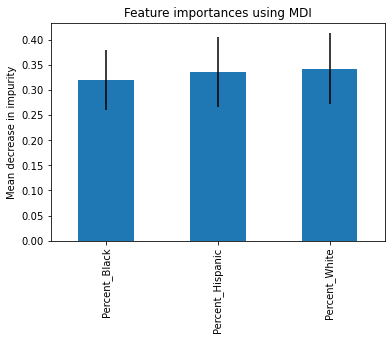

In [14]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import contextily as ctx 

importances = rf.feature_importances_

forest_importances = pd.Series(importances, index=X_train.columns)

std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")


Text(0, 0.5, 'Mean decrease in impurity')

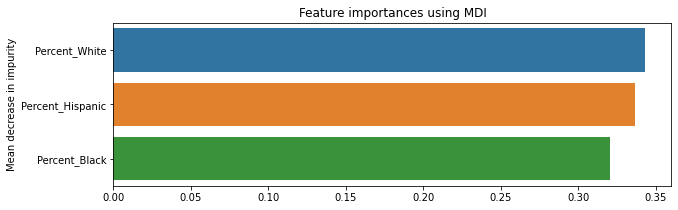

In [15]:
forest_importances.sort_values(inplace=True, ascending=False)

fig, ax = plt.subplots(figsize=(10,3))
sns.barplot(x=forest_importances.values, y=forest_importances.index, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")

What about how the race of the census tract might factor into predicting a drug related offense in general? I'll try to just look at the drug arrests factoring in race data overall to see what it might show.

In [16]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

xvars = ['Percent_Black','Percent_Hispanic','Percent_White']
yvar = 'drug_offense'

df_to_fit = allgdf[xvars+[yvar]].dropna()

X_train, X_test, y_train, y_test = train_test_split(
    df_to_fit[xvars], df_to_fit[yvar], test_size = 0.25, random_state = 1)

print(len(X_train), len(y_train) )
print(len(X_test), len(y_test) )

115519 115519
38507 38507


In [17]:
from sklearn.ensemble import RandomForestClassifier 

rf = RandomForestClassifier(n_estimators = 50, random_state = 1)

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
y_pred

print(len(X_test), len(y_pred))



38507 38507


[[35873    94]
 [ 2480    60]]
Accuracy score: 0.9332
              precision    recall  f1-score   support

       False       0.94      1.00      0.97     35967
        True       0.39      0.02      0.04      2540

    accuracy                           0.93     38507
   macro avg       0.66      0.51      0.50     38507
weighted avg       0.90      0.93      0.90     38507



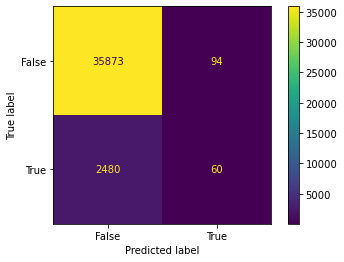

In [18]:

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, ConfusionMatrixDisplay

print(confusion_matrix(y_test, y_pred))
confusion_matrix

print('Accuracy score: {:.4f}'.format(accuracy_score(y_test, y_pred)))

print(classification_report(y_test, y_pred))

ConfusionMatrixDisplay.from_predictions(y_test, y_pred)

So this is a bit more valuable, it seems as if there is a racial component to predicting a drug related arrest for the overall arrest data. The three racial categories are pretty similarly ranked, but the percent of the population that is Black is the strongest variable for predicting a drug related arrest. These are plotted below. Next, I'll include the parks (proximity of the arrest to parks and park names) into my model. 

Text(0, 0.5, 'Mean decrease in impurity')

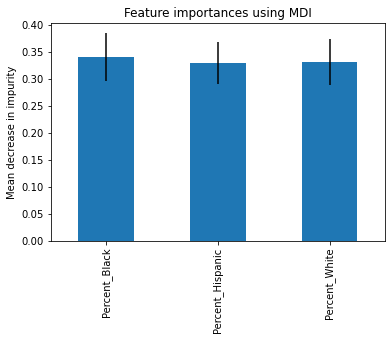

In [19]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import contextily as ctx 

importances = rf.feature_importances_

forest_importances = pd.Series(importances, index=X_train.columns)

std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")


Text(0, 0.5, 'Mean decrease in impurity')

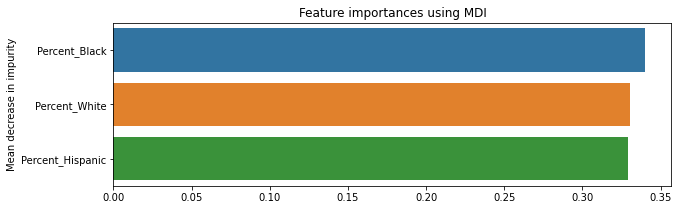

In [20]:
forest_importances.sort_values(inplace=True, ascending=False)

fig, ax = plt.subplots(figsize=(10,3))
sns.barplot(x=forest_importances.values, y=forest_importances.index, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")

### Predicting Drug Related Arrests

Instead of using this model to just predict the drug related arrests near parks, we'll focus instead on if race demographics, park location, and proximity to a park factor into the prediction of a drug related offense.

In [21]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

xvars =  ['Percent_Black','Percent_Hispanic','Percent_White','hundred_m', 'dist_to_park',]
yvar = 'drug_offense'

df_to_fit = allgdf[xvars+[yvar]].dropna()

X_train, X_test, y_train, y_test = train_test_split(
    df_to_fit[xvars], df_to_fit[yvar], test_size = 0.25, random_state = 1)

print(len(X_train), len(y_train) )
print(len(X_test), len(y_test) )


115515 115515
38506 38506


In [22]:
from sklearn.ensemble import RandomForestClassifier 

rf = RandomForestClassifier(n_estimators = 50, random_state = 1)

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
y_pred

print(len(X_test), len(y_pred))

38506 38506


[[35061   845]
 [ 1808   792]]
Accuracy score: 0.9311
              precision    recall  f1-score   support

       False       0.95      0.98      0.96     35906
        True       0.48      0.30      0.37      2600

    accuracy                           0.93     38506
   macro avg       0.72      0.64      0.67     38506
weighted avg       0.92      0.93      0.92     38506



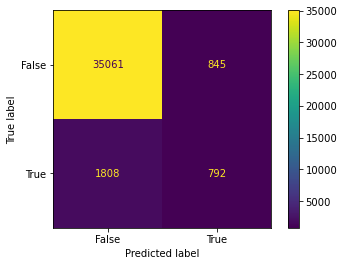

In [23]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, ConfusionMatrixDisplay

print(confusion_matrix(y_test, y_pred))
confusion_matrix

print('Accuracy score: {:.4f}'.format(accuracy_score(y_test, y_pred)))

print(classification_report(y_test, y_pred))

ConfusionMatrixDisplay.from_predictions(y_test, y_pred)

Text(0, 0.5, 'Mean decrease in impurity')

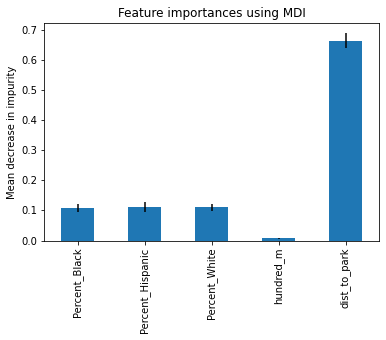

In [24]:
importances = rf.feature_importances_

forest_importances = pd.Series(importances, index=X_train.columns)

std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)

# plot importances
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")

Text(0, 0.5, 'Mean decrease in impurity')

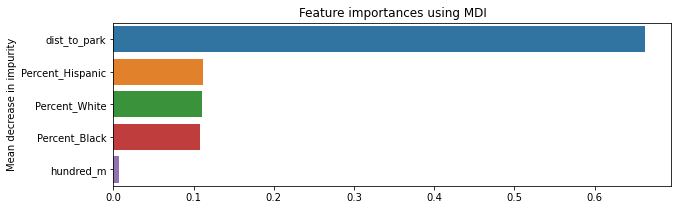

In [25]:
forest_importances.sort_values(inplace=True, ascending=False)

fig, ax = plt.subplots(figsize=(10,3))
sns.barplot(x=forest_importances.values, y=forest_importances.index, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")

This model did a much better job predicting drug related offenses and demonstrates that race does play into that prediction. The dist_to_park variable as the most important is interesting, considering the hundred_m variable (which indicates arrests within 100m of a park) was not very significant at all. This might mean that a greater distance from the park is actually influencing the prediction.

In [26]:
#len(y_pred) 
# y_test
# y_test_df = pd.DataFrame(y_test)
# y_test_df.info()

In [27]:
# y_test_df['y_test']=y_test
# y_test_df

In [28]:
#y_test_df.reset_index(inplace=True)

In [29]:
#df_to_fit

In [30]:
# y_test_df=pd.Series(y_test, index=y_test.index)
# y_test_df.name = 'y_test'
# y_test_df=y_test_df.to_frame()
# y_test_df

In [31]:
# df_to_fit = df_to_fit.join(y_test_df)
# df_to_fit


In [32]:
#df_to_fit.merge(y_test_df)

In [33]:
#importancesdf = pd.DataFrame(importances)
# turn y_test into a DF, add y_pred onto the DF, and then merge onto the old dataframe 

In [34]:
#importancesdf

In [35]:
# plot distance to park against predicted probabibility 

#sns.regplot(x='y_test', y='dist_to_park', data=df_to_fit)

## Predicting Drug Related Arrests by Park

For the last step, we added in the park names as a predicter to try to look at what the top parks are for predicting a drug related offense. 

In [36]:
allgdf.reset_index(inplace=True)

In [37]:
# convert propname (the parks) to a dummy variable

dummies = pd.get_dummies(allgdf.propname, prefix='parkname_')  
print(allgdf.propname.head())
dummies.head()

0    Randall's Island Park
1           Soundview Park
2           Soundview Park
3           Soundview Park
4           Soundview Park
Name: propname, dtype: object


,parkname__Alley Pond Park,parkname__Aqueduct Walk,parkname__Archie Spigner Park,parkname__Arden Woods,parkname__Asphalt Green,parkname__Asser Levy Park,parkname__Astoria Park,parkname__Bailey Playground,parkname__Baisley Pond Park,parkname__Battery Park City,parkname__Bayswater Park,parkname__Belt Parkway/Shore Parkway,parkname__Bensonhurst Park,parkname__Betsy Head Park,parkname__Bloomingdale Park,parkname__Blue Heron Park,parkname__Bowne Park,parkname__Breukelen Ballfields,parkname__Broadway Malls,parkname__Bronx Park,parkname__Bronx River Parkway,parkname__Brookfield Park,parkname__Brooklyn Bridge Park,parkname__Brookville Park,parkname__Brower Park,parkname__CPL. Thompson Park,parkname__Calvert Vaux Park,parkname__Canarsie Park,parkname__Captain Tilly Park,parkname__Carl Schurz Park,parkname__Central Park,parkname__Claremont Park,parkname__Clove Lakes Park,parkname__Coffey Park,parkname__Commodore Barry Park,parkname__Coney Island Beach & Boardwalk,parkname__Coney Island Boat Basin,parkname__Conference House Park,parkname__Cooper Park,parkname__Crescent Beach Park,parkname__Crocheron Park,parkname__Crotona Park,parkname__Crotona Parkway Malls,parkname__Cunningham Park,parkname__Detective Keith L Williams Park,parkname__Devoe Park,parkname__Dyker Beach Park,parkname__East River Walk,parkname__East River Waterfront Esplanade,parkname__Eastern Parkway,parkname__Ewen Park,parkname__Fairview Park,parkname__Ferry Point Park,parkname__Flushing Fields,parkname__Flushing Meadows Corona Park,parkname__Forest Park,parkname__Fort Greene Park,parkname__Fort Totten Park,parkname__Fort Tryon Park,parkname__Fort Washington Park,parkname__Francis Lewis Park,parkname__Frank D. O'Connor Playground,parkname__Frank Golden Park,parkname__Frank Principe Park,parkname__Franklin D. Roosevelt Boardwalk and Beach,parkname__Franz Sigel Park,parkname__Freshkills Park,parkname__Givan Square,parkname__Goodhue Park,parkname__Grand Central Parkway,parkname__Great Kills Park,parkname__Haffen Park,parkname__Hallets Cove Playground,parkname__Harlem River Park,parkname__Harris Park,parkname__Harvey Park,parkname__Henry Hudson Park,parkname__Herbert Von King Park,parkname__Hermon A. MacNeil Park,parkname__Highbridge Park,parkname__Highland Park,parkname__Hunter's Point South Park,parkname__Idlewild Park,parkname__Inwood Hill Park,parkname__Isham Park,parkname__J. Hood Wright Park,parkname__Jackie Robinson Park,parkname__Jamaica Bay Park,parkname__John V. Lindsay East River Park,parkname__Juniper Valley Park,parkname__Kaiser Park,parkname__Kissena Corridor Park,parkname__Kissena Park,parkname__Laurelton Parkway,parkname__Leif Ericson Park,parkname__Lemon Creek Park,parkname__Lincoln Terrace / Arthur S. Somers Park,parkname__Linden Park,parkname__Lindower Park,parkname__Little Bay Park,parkname__Long Pond Park,parkname__Macombs Dam Park,parkname__Madison Square Park,parkname__Manhattan Beach Park,parkname__Marcus Garvey Park,parkname__Maria Hernandez Park,parkname__Marine Park,parkname__McCarren Park,parkname__McGuire Fields,parkname__McKinley Park,parkname__Merriam Playground,parkname__Morningside Park,parkname__Mosholu Parkway,parkname__Msgr. McGolrick Park,parkname__Mullaly Park,parkname__Ocean Breeze Park,parkname__Ocean Parkway Malls,parkname__Owl's Head Park,parkname__Park Avenue Malls,parkname__Pelham Bay Park,parkname__Pelham Parkway,parkname__Powell's Cove Park,parkname__Prospect Park,parkname__Pugsley Creek Park,parkname__Queens Farm Park,parkname__Queensbridge Park,parkname__Rainey Park,parkname__Randall's Island Park,parkname__Red Hook Recreation Area,parkname__Richman (Echo) Park,parkname__Richmond Parkway,parkname__River Avenue Parks,parkname__Riverdale Park,parkname__Riverside Park,parkname__Riverside Park South,parkname__Rochdale Park,parkname__Rockaway Beach,parkname__Rockaway Beach Boardwalk,parkname__Rockaway Beach and Boardwalk,parkname__Rockaway Community Park,parkname__Rockaway Freeway,parkname__Roy Wilkins Recreation Center,parkname__Rufu

In [38]:
allgdf = allgdf.join(dummies)
allgdf.head()

,index,geoid,name,Total,White,Black,American Indian and Alaska Native,Asian,Pacific Islander,Other Race,Two or more races,Hispanic,Percent_White,Percent_Black,Percent_American_Indian_and_Alaska Native,Percent_Asian,Percent_Pacific_Islander,Percent_Other_Race,Percent_Two_or_more_races,Percent_Hispanic,geometry,index_right,arrest_key,arrest_date,pd_cd,pd_desc,ky_cd,ofns_desc,law_code,law_cat_cd,arrest_boro,arrest_precinct,jurisdiction_code,age_group,perp_sex,perp_race,x_coord_cd,y_coord_cd,latitude,longitude,geocoded_column,:@computed_region_f5dn_yrer,:@computed_region_yeji_bk3q,:@computed_region_92fq_4b7q,:@computed_region_sbqj_enih,:@computed_region_efsh_h5xi,old,propname,retireddate,zipcode,acres,location,nys_assembly,councildistrict,description,us_congress,gispropnum,retired,communityboard,department,subcategory,precinct,omppropid,sitename,nys_senate,borough,dist_to_park,hundred_m,drug_offense,park_drug,parkname__Alley Pond Park,parkname__Aqueduct Walk,parkname__Archie Spigner Park,parkname__Arden Woods,parkname__Asphalt Green,parkname__Asser Levy Park,parkname__Astoria Park,parkname__Bailey Playground,parkname__Baisley Pond Park,parkname__Battery Park City,parkname__Bayswater Park,parkname__Belt Parkway/Shore Parkway,parkname__Bensonhurst Park,parkname__Betsy Head Park,parkname__Bloomingdale Park,parkname__Blue Heron Park,parkname__Bowne Park,parkname__Breukelen Ballfields,parkname__Broadway Malls,parkname__Bronx Park,parkname__Bronx River Parkway,parkname__Brookfield Park,parkname__Brooklyn Bridge Park,parkname__Brookville Park,parkname__Brower Park,parkname__CPL. Thompson Park,parkname__Calvert Vaux Park,parkname__Canarsie Park,parkname__Captain Tilly Park,parkname__Carl Schurz Park,parkname__Central Park,parkname__Claremont Park,parkname__Clove Lakes Park,parkname__Coffey Park,parkname__Commodore Barry Park,parkname__Coney Island Beach & Boardwalk,parkname__Coney Island Boat Basin,parkname__Conference House Park,parkname__Cooper Park,parkname__Crescent Beach Park,parkname__Crocheron Park,parkname__Crotona Park,parkname__Crotona Parkway Malls,parkname__Cunningham Park,parkname__Detective Keith L Williams Park,parkname__Devoe Park,parkname__Dyker Beach Park,parkname__East River Walk,parkname__East River Waterfront Esplanade,parkname__Eastern Parkway,parkname__Ewen Park,parkname__Fairview Park,parkname__Ferry Point Park,parkname__Flushing Fields,parkname__Flushing Meadows Corona Park,parkname__Forest Park,parkname__Fort Greene Park,parkname__Fort Totten Park,parkname__Fort Tryon Park,parkname__Fort Washington Park,parkname__Francis Lewis Park,parkname__Frank D. O'Connor Playground,parkname__Frank Golden Park,parkname__Frank Principe Park,parkname__Franklin D. Roosevelt Boardwalk and Beach,parkname__Franz Sigel Park,parkname__Freshkills Park,parkname__Givan Square,parkname__Goodhue Park,parkname__Grand Central Parkway,parkname__Great Kills Park,parkname__Haffen Park,parkname__Hallets Cove Playground,parkname__Harlem River Park,parkname__Harris Park,parkname__Harvey Park,parkname__Henry Hudson Park,parkname__Herbert Von King Park,parkname__Hermon A. MacNeil Park,parkname__Highbridge Park,parkname__Highland Park,parkname__Hunter's Point South Park,parkname__Idlewild Park,parkname__Inwood Hill Park,parkname__Isham Park,parkname__J. Hood Wright Park,parkname__Jackie Robinson Park,parkname__Jamaica Bay Park,parkname__John V. Lindsay East River Park,parkname__Juniper Valley Park,parkname__Kaiser Park,parkname__Kissena Corridor Park,parkname__Kissena Park,parkname__Laurelton Parkway,parkname__Leif Ericson Park,parkname__Lemon Creek Park,parkname__Lincoln Terrace / Arthur S. Somers Park,parkname__Linden Park,parkname__Lindower Park,parkname__Little Bay Park,parkname__Long Pond Park,parkname__Macombs Dam Park,parkname__Madison Square Park,parkname__Manhattan Beach Park,parkname__Marcus Garvey Park,parkname__Maria Hernandez Park,parkname__Marine Park,parkname__McCarren Park,parkname__McGuire Fields,parkname__McKinley Park,parkname__Me

In [39]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

xvars =  (dummies.columns.tolist() + ['Percent_Black','Percent_Hispanic','Percent_White','hundred_m', 'dist_to_park',])
yvar = 'drug_offense'

df_to_fit = allgdf[xvars+[yvar]].dropna()

X_train, X_test, y_train, y_test = train_test_split(
    df_to_fit[xvars], df_to_fit[yvar], test_size = 0.25, random_state = 1)

print(len(X_train), len(y_train) )
print(len(X_test), len(y_test) )


115515 115515
38506 38506


In [40]:
from sklearn.ensemble import RandomForestClassifier 

rf = RandomForestClassifier(n_estimators = 50, random_state = 1)

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
y_pred

print(len(X_test), len(y_pred))

38506 38506


[[35030   876]
 [ 1801   799]]
Accuracy score: 0.9305
              precision    recall  f1-score   support

       False       0.95      0.98      0.96     35906
        True       0.48      0.31      0.37      2600

    accuracy                           0.93     38506
   macro avg       0.71      0.64      0.67     38506
weighted avg       0.92      0.93      0.92     38506



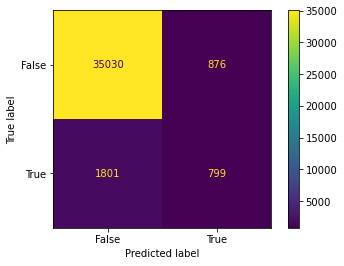

In [41]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, ConfusionMatrixDisplay

print(confusion_matrix(y_test, y_pred))
confusion_matrix

print('Accuracy score: {:.4f}'.format(accuracy_score(y_test, y_pred)))

print(classification_report(y_test, y_pred))

ConfusionMatrixDisplay.from_predictions(y_test, y_pred)

Text(0, 0.5, 'Mean decrease in impurity')

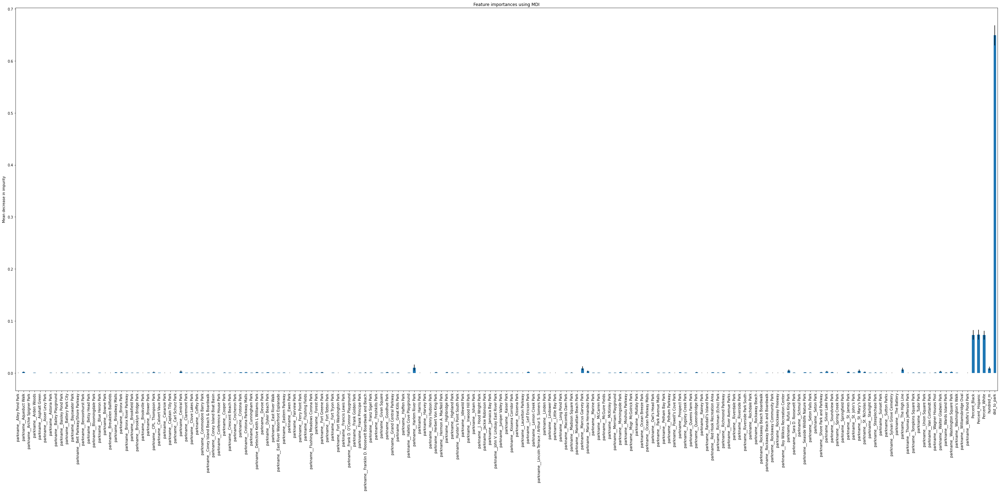

In [42]:
importances = rf.feature_importances_

forest_importances = pd.Series(importances, index=X_train.columns)

std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)

# plot importances
fig, ax = plt.subplots(figsize=(50,20))
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")

Text(0, 0.5, 'Mean decrease in impurity')

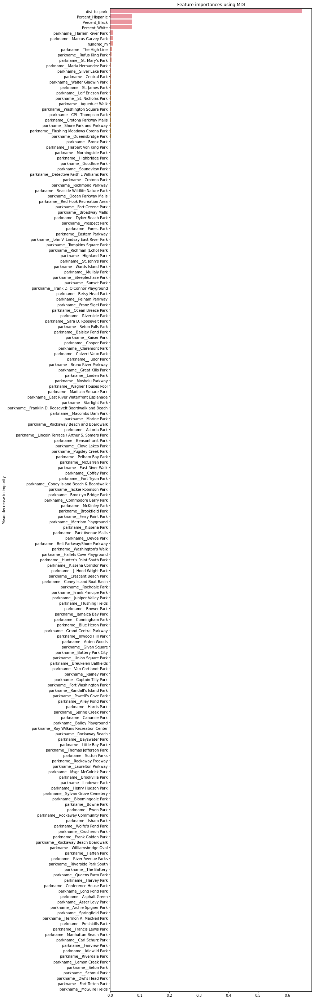

In [43]:
forest_importances.sort_values(inplace=True, ascending=False)

fig, ax = plt.subplots(figsize=(10,50))
sns.barplot(x=forest_importances.values, y=forest_importances.index, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")

This is definitely interesting, because the two parks that show up as the greatest variables to influence the prediction of drug related arrests are Harlem River and Marcus Garvey Park, which are both parks in Harlem (a historically Black and lower income borough). The next park down is the High Line, which is in a very wealthy part of New York City (which perhaps means people would be more criminalized). So the location of the park appears to be a valuable metric in predicting whether there will be a drug related arrest. However, these parks appear to be both within some lower income, non white neighborhoods and in some of the major parks in wealthy areas, like Central Park and the High Line. There is definitely more to explored there in the future! 

# NYC Park Maps

Since our analysis pinpointed the parks that had the most arrests in surrounding areas we developed maps of those 10 locations below. These parks included Harlem River Park in Harlem, Marcus Garvey Park in Harlem, The High Line in Chelsea, Rufus King Park in Jamaica Queens, St. Mary's Park in the Bronx, Maria Hernandez Park in Brooklyn, Silver Lake Park in Staten Island, Central Park in Manhattan, Walter Gladwin Park in the Bronx, and St. James Park in the Bronx.

In [44]:
parkgdf_drugarrests = parkgdf[parkgdf['propname'].isin(['Harlem River Park','Marcus Garvey Park', 'The High Line','Rufus King Park',"St. Mary's Park",'Maria Hernandez Park','Silver Lake Park','Central Park','Walter Gladwin Park','St. James Park'])]

In [45]:
race_Df_web_mercator = race_Df.to_crs(epsg=3857)

Text(0.5, 1.0, 'Top 10 Parks for Predicted Drug Related Arrests in NYC and Majority Hispanic Census Tracts')

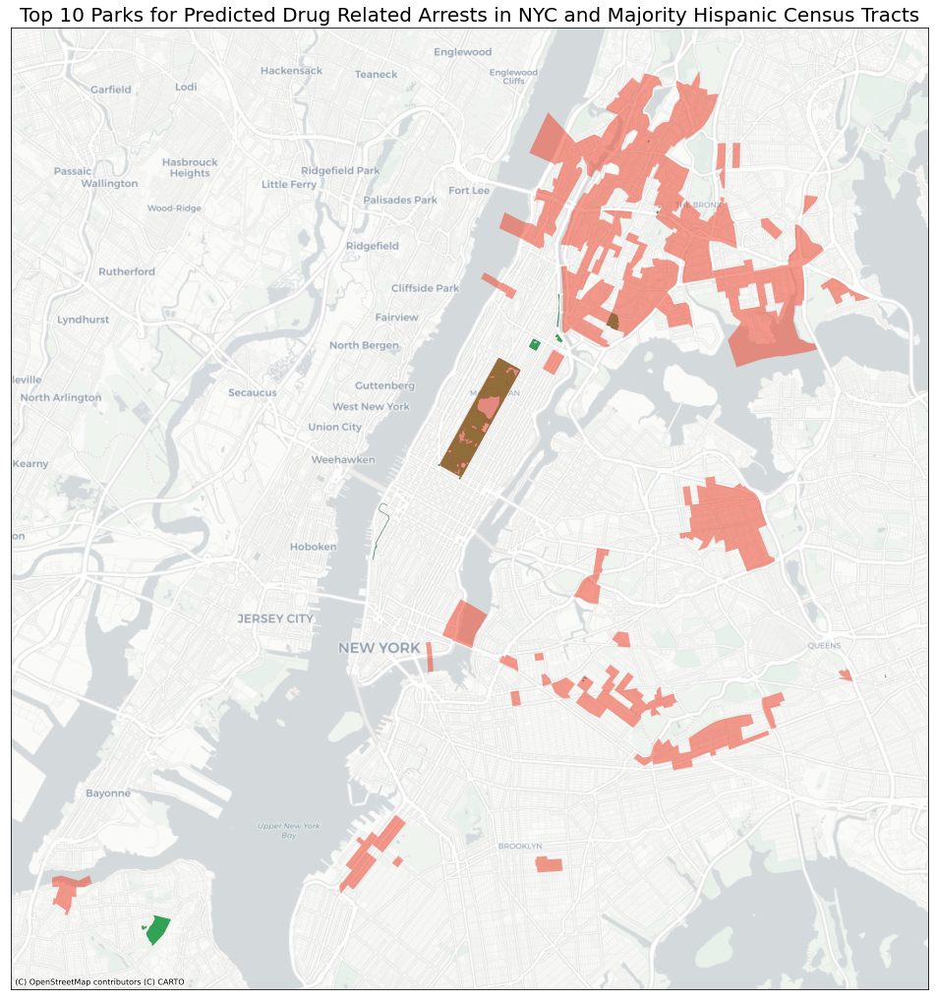

In [46]:
fig, ax = plt.subplots(figsize=(18,18))
parkgdf_drugarrests.to_crs('EPSG:3857').plot(color='#31a354', edgecolor='black',lw=0.1, alpha=1.0, ax=ax)

race_Df_web_mercator[race_Df_web_mercator['Percent_Hispanic']>60].plot(ax=ax, 
                                                                       edgecolor='grey',
                                                                         lw=0.1,
                                                                       alpha=0.5, 
                                                                       color='#f03b20')

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, zoom=12)

ax.set_xticks([])
ax.set_yticks([])

plt.title("Top 10 Parks for Predicted Drug Related Arrests in NYC and Majority Hispanic Census Tracts",fontdict={'fontsize': 20})

This map shows both of our Census data and top ten parks where most drug arrets occured. As noted above the two top parks in the analysis (Harlem River and Marcus Garvey Park) are both located in Harlem. Our census tracts in orange shows communities with more than 60% Hispanic community. Some of these tracts just border the parks.

Text(0.5, 1.0, 'Top 10 Parks for Predicted Drug Related Arrests in NYC and Majority Black Census Tracts')

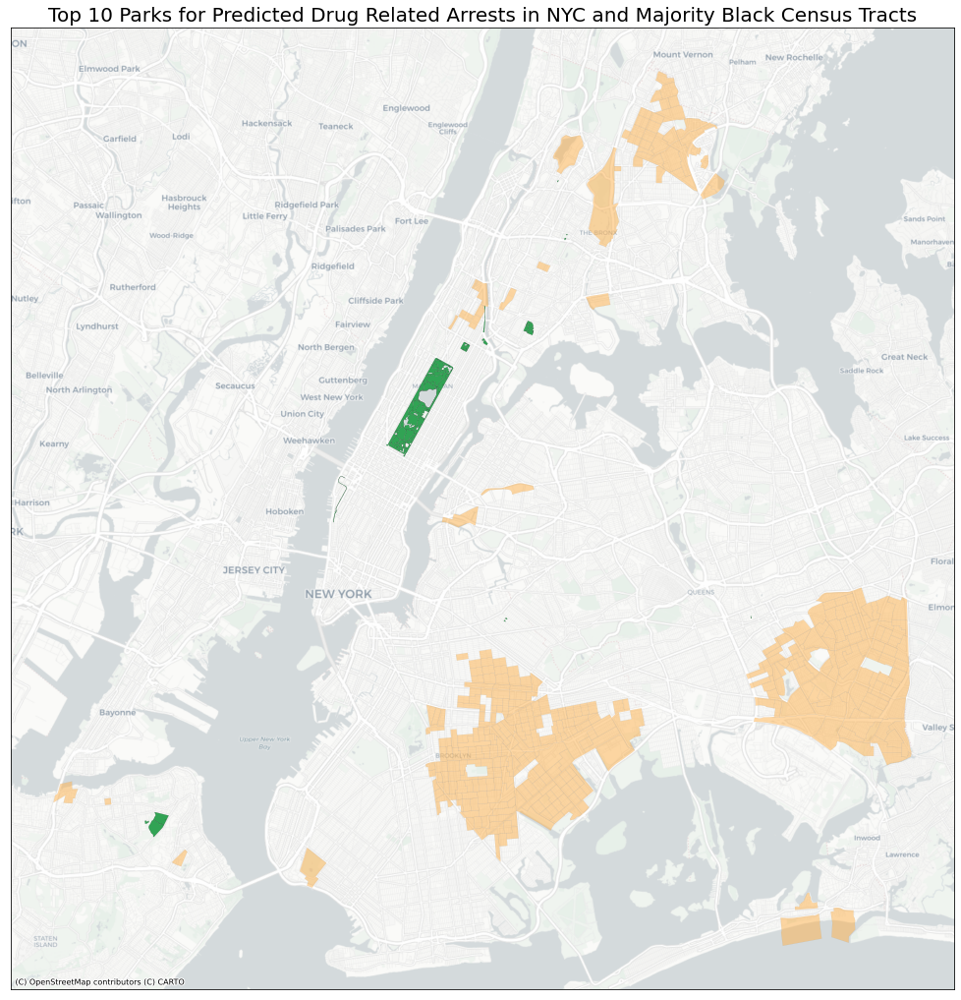

In [47]:
fig, ax = plt.subplots(figsize=(18,18))
parkgdf_drugarrests.to_crs('EPSG:3857').plot(color='#31a354', edgecolor='black',lw=0.1, alpha=1.0, ax=ax)

race_Df_web_mercator[race_Df_web_mercator['Percent_Black']>60].plot(ax=ax, 
                                                                       edgecolor='grey',
                                                                         lw=0.1,
                                                                       alpha=0.5, 
                                                                       color='#feb24c')

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, zoom=12)

ax.set_xticks([])
ax.set_yticks([])

plt.title("Top 10 Parks for Predicted Drug Related Arrests in NYC and Majority Black Census Tracts",fontdict={'fontsize': 20})

Similarly, we mapped the Census tracts that were more than 60% Black communities. As our map above we can see that these tracts also border (Harlem River and Marcus Garvey Park).

Text(0.5, 1.0, 'Top 10 Parks for Predicted Drug Related Arrests in NYC and Majority Non-White Census Tracts')

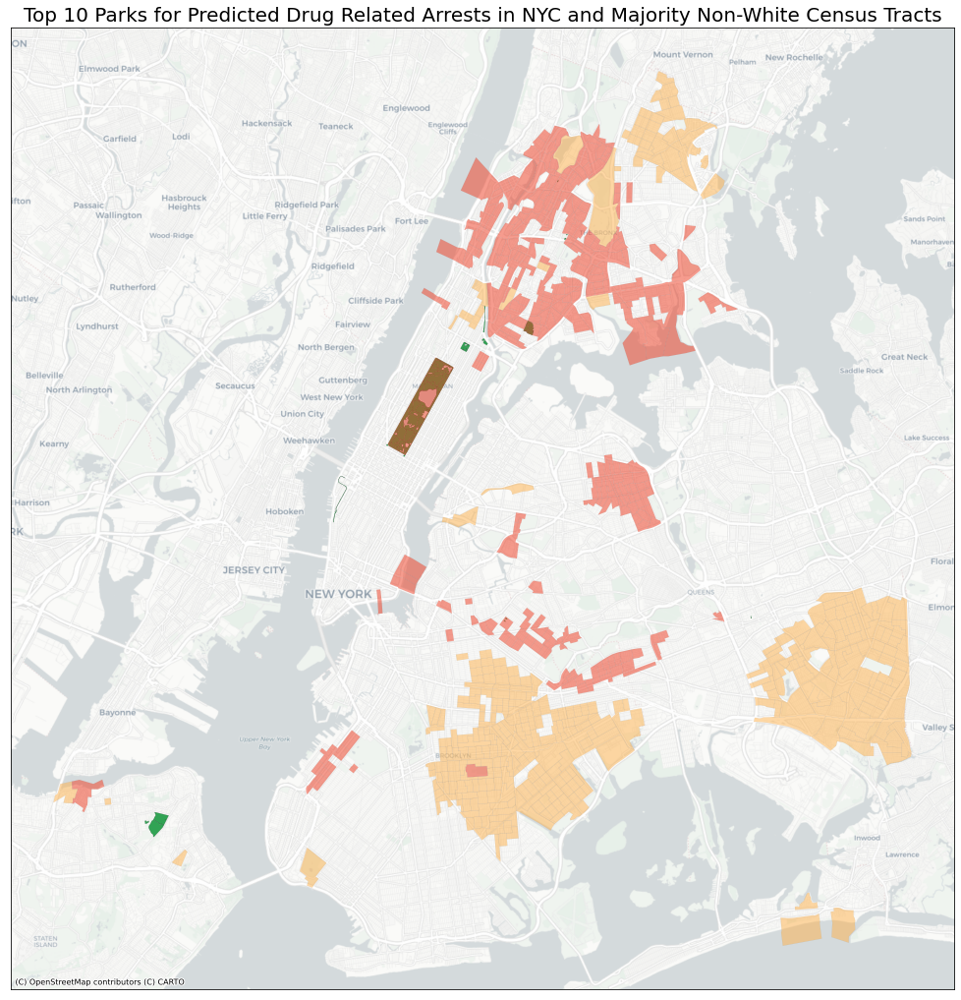

In [48]:
fig, ax = plt.subplots(figsize=(18,18))
parkgdf_drugarrests.to_crs('EPSG:3857').plot(color='#31a354', edgecolor='black',lw=0.1, alpha=1.0, ax=ax)

race_Df_web_mercator[race_Df_web_mercator['Percent_Black']>60].plot(ax=ax, 
                                                                       edgecolor='grey',
                                                                         lw=0.1,
                                                                       alpha=0.5, 
                                                                       color='#feb24c')
race_Df_web_mercator[race_Df_web_mercator['Percent_Hispanic']>60].plot(ax=ax, 
                                                                       edgecolor='grey',
                                                                         lw=0.1,
                                                                       alpha=0.5, 
                                                                       color='#f03b20')

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, zoom=12)

ax.set_xticks([])
ax.set_yticks([])

plt.title("Top 10 Parks for Predicted Drug Related Arrests in NYC and Majority Non-White Census Tracts",fontdict={'fontsize': 20})

The map above shows census tract level race data from the American Community Survey layered with the top parks. This was done in an effort to see what communities might be at risk of having higher policing rates. The darker orange is census tracts where over 60% of the population is Hispanic and the lighter orange shows census tracts where more than 60% of the population is predominiantly Black. This allows us to have a visual of where these parks are located in relation to these neighborhoods. There is some room here to further investigate and analyze arrest data further in these areas. 

It is a bit difficult to see the ten different parks given how small and spread out they are, so lets try to zoom into them below.

In [49]:
parkgdf_drugarrests1 = parkgdf[parkgdf['propname'].isin(['Harlem River Park'])]
parkgdf_drugarrests2 = parkgdf[parkgdf['propname'].isin(['Marcus Garvey Park'])]
parkgdf_drugarrests3 = parkgdf[parkgdf['propname'].isin(['The High Line'])]
parkgdf_drugarrests4 = parkgdf[parkgdf['propname'].isin(['Rufus King Park'])]
parkgdf_drugarrests5 = parkgdf[parkgdf['propname'].isin(["St. Mary's Park"])]
parkgdf_drugarrests6 = parkgdf[parkgdf['propname'].isin(['Maria Hernandez Park'])]
parkgdf_drugarrests7 = parkgdf[parkgdf['propname'].isin(['Silver Lake Park'])]
parkgdf_drugarrests8 = parkgdf[parkgdf['propname'].isin(['Central Park'])]
parkgdf_drugarrests9 = parkgdf[parkgdf['propname'].isin(['Walter Gladwin Park'])]
parkgdf_drugarrests10 = parkgdf[parkgdf['propname'].isin(['St. James Park'])]

Text(0.5, 1.0, 'Top 10 Parks for Predicted Drug Related Arrests in New York City')

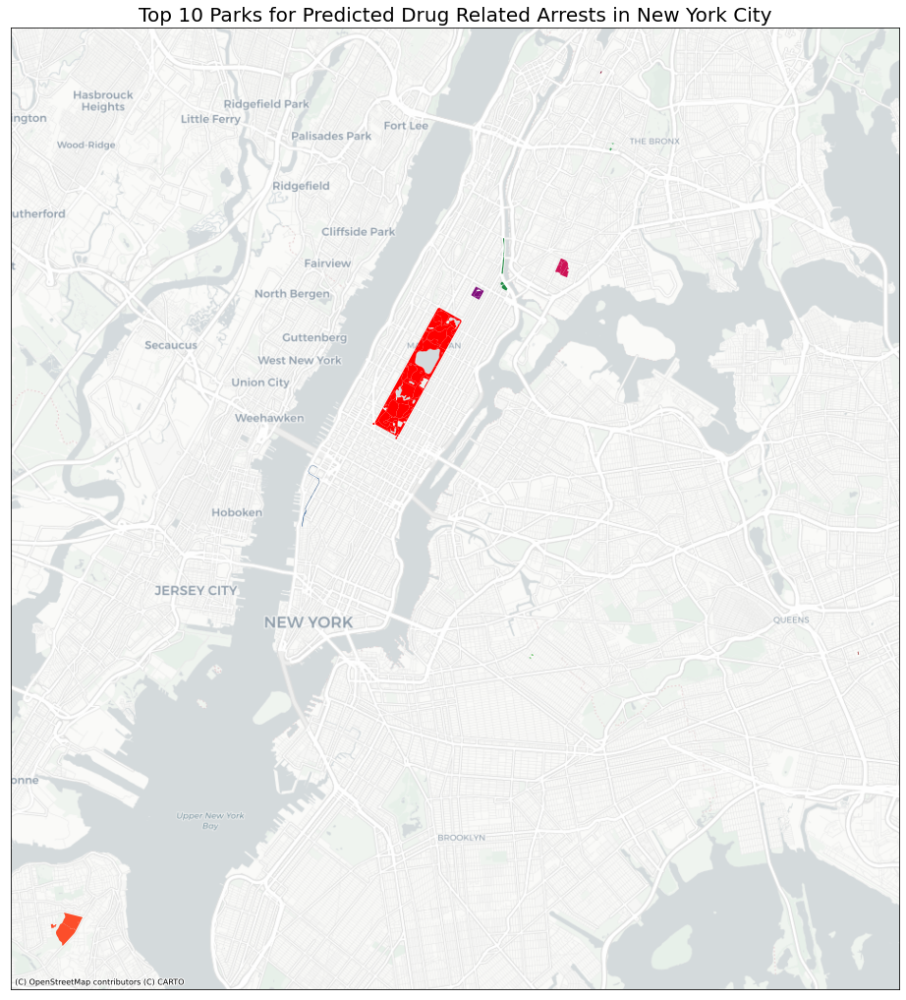

In [50]:
fig, ax = plt.subplots(figsize=(18,18))
parkgdf_drugarrests1.to_crs('EPSG:3857').plot(color='#238b45', alpha=1.0, ax=ax) #green
parkgdf_drugarrests2.to_crs('EPSG:3857').plot(color='#810f7c', alpha=1.0, ax=ax) #purple
parkgdf_drugarrests3.to_crs('EPSG:3857').plot(color='#084081', alpha=1.0, ax=ax) #Navy
parkgdf_drugarrests4.to_crs('EPSG:3857').plot(color='#7f0000', alpha=1.0, ax=ax) #darkred
parkgdf_drugarrests5.to_crs('EPSG:3857').plot(color='#ce1256', alpha=1.0, ax=ax) #redpink
parkgdf_drugarrests6.to_crs('EPSG:3857').plot(color='#78c679', alpha=1.0, ax=ax) #limegreen
parkgdf_drugarrests7.to_crs('EPSG:3857').plot(color='#fc4e2a', alpha=1.0, ax=ax) #orange
parkgdf_drugarrests8.to_crs('EPSG:3857').plot(color='r', alpha=1.0, ax=ax)        #red
parkgdf_drugarrests9.to_crs('EPSG:3857').plot(color='#31a354', alpha=1.0, ax=ax) #lime green
parkgdf_drugarrests10.to_crs('EPSG:3857').plot(color='#800026', alpha=1.0, ax=ax) #velvet

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron, zoom=12)

ax.set_xticks([])
ax.set_yticks([])
plt.title("Top 10 Parks for Predicted Drug Related Arrests in New York City",fontdict={'fontsize': 20})

These parks are a bit difficult to see, lets try to zoom in and get a better look. Some of the parks in our top ten lists are relatively small compared to Central Park.

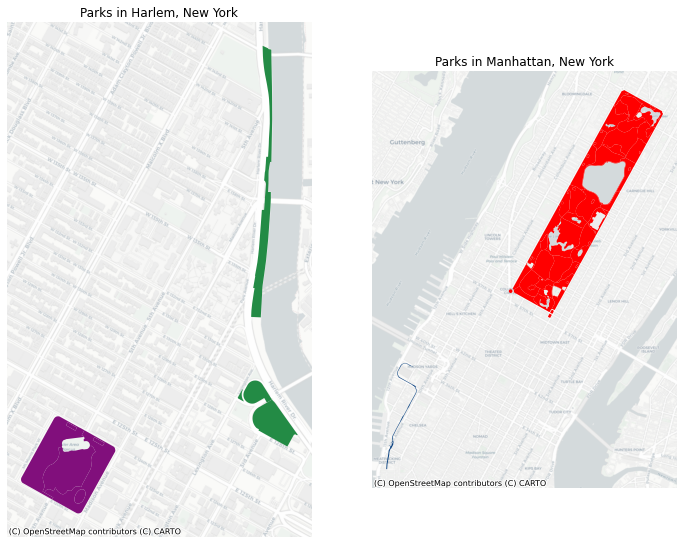

In [51]:
fig, ax = plt.subplots(1,2,figsize=(12,12))

ax1,ax2=ax

ax1.axis('off')
ax1.set_aspect(aspect=2.5)
ax1.set_title("Parks in Harlem, New York")
parkgdf_drugarrests1.to_crs('EPSG:3857').plot(color='#238b45', alpha=1.0, ax=ax1)
parkgdf_drugarrests2.to_crs('EPSG:3857').plot(color='#810f7c', alpha=1.0, ax=ax1)

ax2.axis('off')
ax2.set_aspect(aspect=0.5)
ax2.set_title("Parks in Manhattan, New York")
parkgdf_drugarrests3.to_crs('EPSG:3857').plot(color='#084081', alpha=1.0, ax=ax2)
parkgdf_drugarrests8.to_crs('EPSG:3857').plot(color='r', alpha=1.0, ax=ax2)

#basemap
ctx.add_basemap(ax1,source=ctx.providers.CartoDB.Positron)
ctx.add_basemap(ax2,source=ctx.providers.CartoDB.Positron)

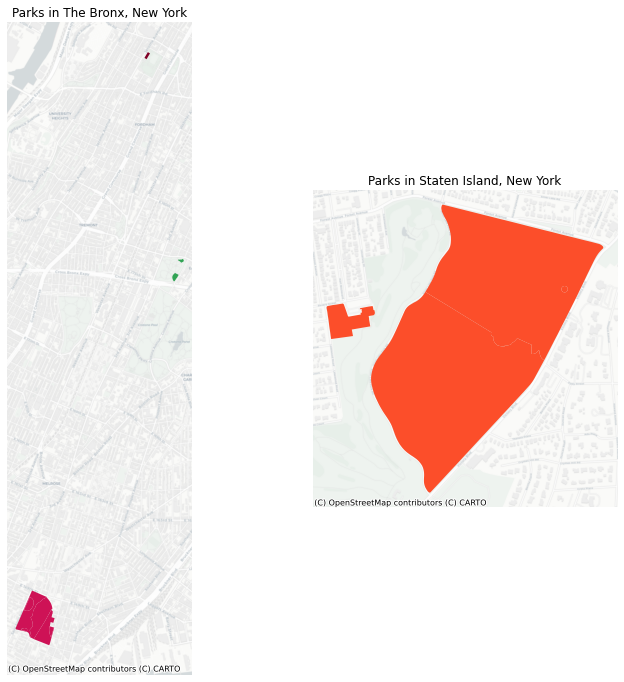

In [52]:
fig, ax = plt.subplots(1,2,figsize=(12,12))

ax1,ax2 = ax

ax1.axis('off')

ax1.set_title("Parks in The Bronx, New York")
parkgdf_drugarrests5.to_crs('EPSG:3857').plot(color='#ce1256', alpha=1.0, ax=ax1)
parkgdf_drugarrests9.to_crs('EPSG:3857').plot(color='#31a354', alpha=1.0, ax=ax1)
parkgdf_drugarrests10.to_crs('EPSG:3857').plot(color='#800026', alpha=1.0, ax=ax1)

ax2.axis('off')
ax2.set_title("Parks in Staten Island, New York")
parkgdf_drugarrests7.to_crs('EPSG:3857').plot(color='#fc4e2a', alpha=1.0, ax=ax2)

#basemap
ctx.add_basemap(ax1,source=ctx.providers.CartoDB.Positron)
ctx.add_basemap(ax2,source=ctx.providers.CartoDB.Positron)

/Users/stephanieandrade/opt/anaconda3/envs/uds/lib/python3.8/site-packages/contextily/tile.py:581: UserWarning: The inferred zoom level of 21 is not valid for the current tile provider (valid zooms: 0 - 20).
  warnings.warn(msg)


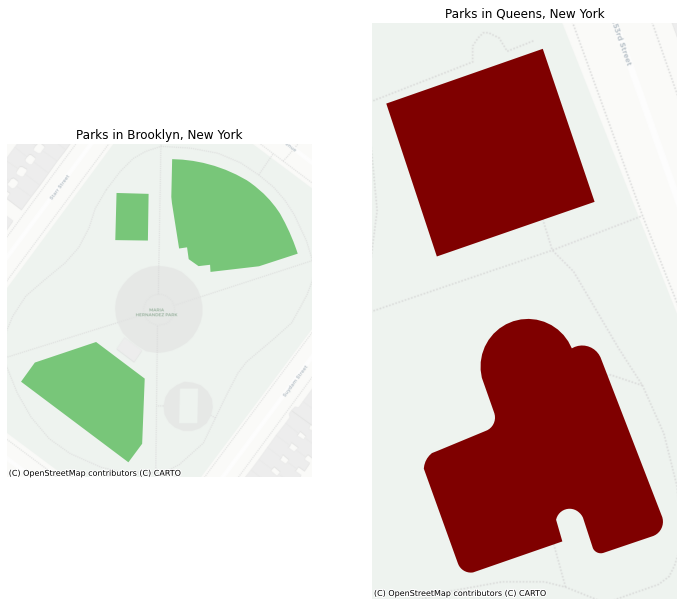

In [53]:
fig, ax = plt.subplots(1,2,figsize=(12,12))

ax1,ax2 = ax

ax1.axis('off')
ax1.set_title("Parks in Brooklyn, New York")
parkgdf_drugarrests6.to_crs('EPSG:3857').plot(color='#78c679', alpha=1.0, ax=ax1)

ax2.axis('off')
ax2.set_title("Parks in Queens, New York")
parkgdf_drugarrests4.to_crs('EPSG:3857').plot(color='#7f0000', alpha=1.0, ax=ax2)

#basemap
ctx.add_basemap(ax1,source=ctx.providers.CartoDB.Positron)
ctx.add_basemap(ax2,source=ctx.providers.CartoDB.Positron)

# Conclusion 

When we first started exploring this relationship between parks and arrests, it was a surprising finding that there is very little difference between the arrests that happen all over New York versus the arrests that happen near parks. Our original hypothesis that more street vendors might be criminalized or that people might be arrested for crimes associated with homelessness more often near parks was not apparent from our exploration of arrests (see the notebook "Exploratory Analysis of Parks and Arrests" in our GitHub repository). There were some subtle differences (like more traffic and drug related arrests happening within 100m of a park), but nothing very substantial. Apparently being near a park does not impact the type of arrest that is happening and people are not more criminalized for particular activities in public green spaces as we would have expected. 

For our predictive models, we explored whether the racial makeup of the surrounding census tracts along with the proximity to and location of the park might influence a predicted drug related offense. It does appear as if race is a major predictor for whether a drug related arrest will occur, though interestingly Black, Hispanic, and white percentages were all pretty evenly ranked. The strongest predictor was the distance to the parks, but whether it was close to a park (within 100m) was less of an important factor. 

Lastly, we looked at if the particular parks will influence the prediction of a drug related offense. After looking at the feature importances, we found that the top 10 parks for predicting a drug related arrest are Harlem River Park, Marcus Garvey Park, The High Line, Rufus King Park, St. Mary's Park, Maria Hernandez Park, Silver Lake Park, Central Park, Walter Gladwin Park, and St. James Park. So we have a representation of parks across boroughs and geographies in New York City.

**Future work:** Overall, I would like to go a bit further in exploring this predictive model. What are some other types of arrests that we could have looked at? How else might we be able to explore the types of arrests that happen near parks? What makes particular parks targets for arrests? Why was the distance to parks variable so significant in predicting drug related arrests? How could we visualize this relationship? I was not able to work through how I would plot the relationship between the predicted probability and the distance to parks as a scatterplot, so this step would be helpful in the future in helping to visualize why that variable mattered so much. With the top 10 parks we uncovered at the end, what about those parks mattered in particular? Why are these parks potential targets for drug related arrests? There are still a lot of compelling questions that this project revealed that future research could help to uncover, even though it did not necessarily show what we expected it to! 